In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, VotingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.impute import SimpleImputer
from random import randint
from sklearn.model_selection import RandomizedSearchCV, KFold
from scipy.stats import randint as sp_randint

In [2]:
# Load the dataset
df = pd.read_csv('weather.csv')

# Display the first few rows of the dataset
df.head()

,location,Basel,Basel.1,Basel.2,Basel.3,Basel.4,Basel.5,Basel.6,Basel.7,Basel.8,Basel.9,Basel.10,Basel.11,Basel.12,Basel.13,Basel.14,Basel.15,Basel.16,Basel.17,Basel.18
0,lat,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000,47.75000
1,lon,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000,7.50000
2,asl,363.653,363.653,363.653,363.653,363.653,363.653,363.653,363.653,363.653,363.653,363.653,363.653,363.653,363.653,363.653,363.653,363.653,363.653,363.653
3,variable,Temperature,Temperature,Temperature,Precipitation Total,Relative Humidity,Wind Gust,Wind Speed,Wind Direction,Wind Speed,Wind Direction,Cloud Cover Total,CAPE,Shortwave Radiation,Mean Sea Level Pressure,Geopotential Height,Evapotranspiration,Temperature,Soil Moisture,Soil Moisture
4,unit,°C,°C,°C,mm,%,km/h,km/h,°,km/h,°,%,J/kg,W/m²,hPa,Gpm,mm,°C,m³/m³,m³/m³


In [3]:
def clean_weather_data(df):
  
    # Get the actual data rows (from row 9 onwards)
    data = df.iloc[9:].copy()
    
    # Convert location column to datetime
    data['timestamp'] = pd.to_datetime(data['location'], format='%Y%m%dT%H%M')
    data = data.set_index('timestamp')
    
    # Create meaningful column names using variable and level information
    variables = df.iloc[3]  # Variable names
    levels = df.iloc[5]     # Level information
    
    # Create new column names
    new_columns = {}
    for col in df.columns[1:]:  # Skip 'location' column
        var = variables[col]
        level = levels[col]
        if level and level != 'sfc':
            new_name = f"{var}_{level}".replace(' ', '_')
        else:
            new_name = var.replace(' ', '_')
        new_columns[col] = new_name
    
    # Rename columns
    data = data.rename(columns=new_columns)
    
    # Convert all data columns to numeric
    for col in data.columns:
        data[col] = pd.to_numeric(data[col], errors='coerce')
    
    # Drop columns with all null values
    data = data.dropna(axis=1, how='all')
    
    # Drop rows with any null values
    data = data.dropna(axis=0, how='any')
    
    return data

# Clean the data
cleaned_df = clean_weather_data(df)

# Display the first few rows of the cleaned dataset
cleaned_df.head()

,Temperature_2_m_elevation_corrected,Temperature_700_mb,Temperature_500_mb,Precipitation_Total,Relative_Humidity_2_m,Wind_Gust,Wind_Speed_10_m,Wind_Direction_10_m,Wind_Speed_850_mb,Wind_Direction_850_mb,Cloud_Cover_Total,CAPE_180-0_mb_above_gnd,Shortwave_Radiation,Mean_Sea_Level_Pressure_MSL,Geopotential_Height_500_mb,Evapotranspiration,Temperature,Soil_Moisture_0-7_cm_down,Soil_Moisture_28-100_cm_down
timestamp,,,,,,,,,,,,,,,,,,,
2024-01-01 00:00:00,6.530245,-11.46,-30.82,0.0,81.28490,34.560000,15.946010,208.30075,66.758400,253.71509,73.0,3.0,0.0,1012.5,5423.0,0.02592,2.97,0.398,0.396
2024-01-01 01:00:00,6.240245,-11.86,-31.19,0.0,83.22755,35.280000,15.683774,211.86598,69.929016,253.24426,73.0,10.0,0.0,1012.6,5417.0,0.02592,3.14,0.396,0.396
2024-01-01 02:00:00,6.210245,-11.93,-31.71,0.0,84.71120,41.039997,16.704155,217.11687,70.380690,255.18185,84.0,10.0,0.0,1013.0,5416.0,0.03168,3.36,0.396,0.396
2024-01-01 03:00:00,6.170245,-12.08,-30.79,0.1,84.94641,40.320000,16.363178,219.64418,66.234120,259.66730,74.0,9.0,0.0,1013.2,5415.0,0.03600,3.27,0.395,0.396
2024-01-01 04:00:00,6.160245,-12.23,-29.84,0.0,83.80913,36.719997,16.323528,221.42366,61.213760,259.15265,50.0,11.0,0.0,1013.3,5415.0,0.03312,3.52,0.395,0.396


In [4]:
# Check the data types of each column
print("Data Types:\n", cleaned_df.dtypes)

# Get summary statistics of the dataset
print("\nSummary Statistics:\n", cleaned_df.describe())

# Check for missing values
print("\nMissing Values:\n", cleaned_df.isnull().sum())

Data Types:
 Temperature_2_m_elevation_corrected    float64
Temperature_700_mb                     float64
Temperature_500_mb                     float64
Precipitation_Total                    float64
Relative_Humidity_2_m                  float64
Wind_Gust                              float64
Wind_Speed_10_m                        float64
Wind_Direction_10_m                    float64
Wind_Speed_850_mb                      float64
Wind_Direction_850_mb                  float64
Cloud_Cover_Total                      float64
CAPE_180-0_mb_above_gnd                float64
Shortwave_Radiation                    float64
Mean_Sea_Level_Pressure_MSL            float64
Geopotential_Height_500_mb             float64
Evapotranspiration                     float64
Temperature                            float64
Soil_Moisture_0-7_cm_down              float64
Soil_Moisture_28-100_cm_down           float64
dtype: object

Summary Statistics:
        Temperature_2_m_elevation_corrected  Temperature_70

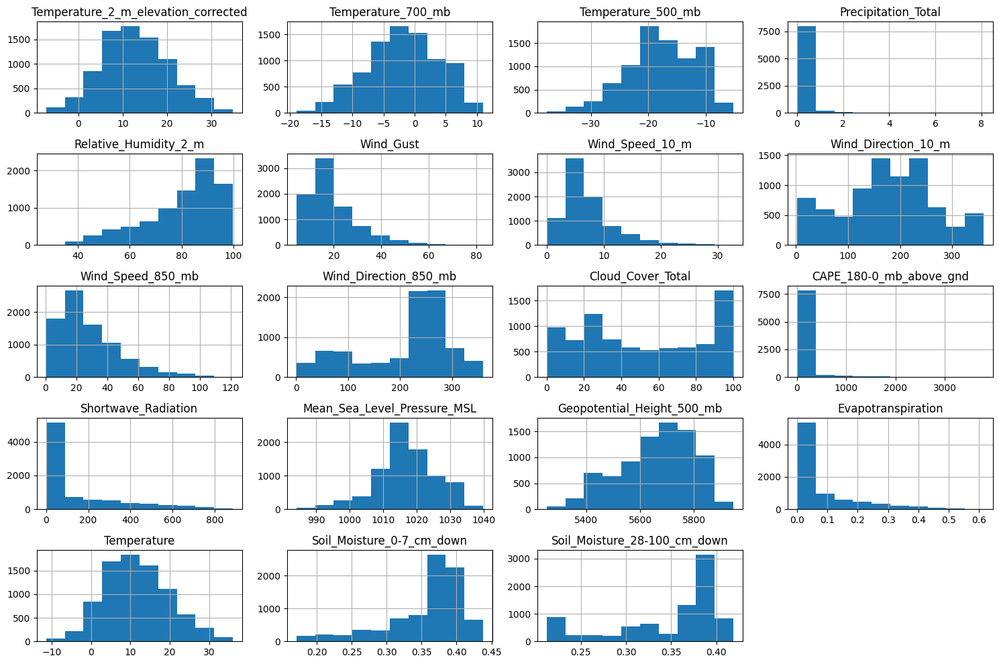

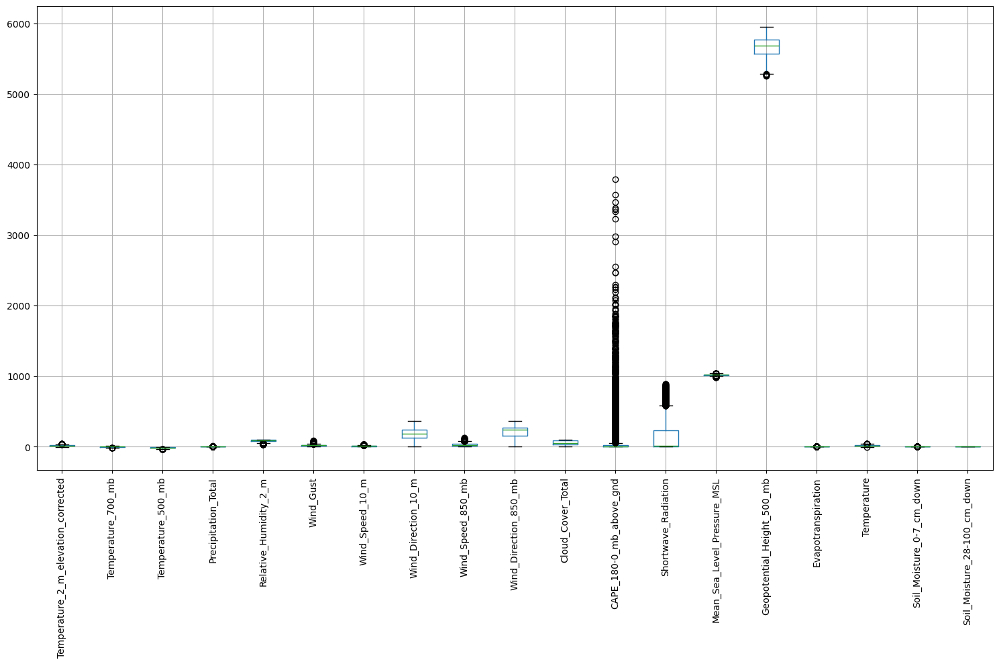

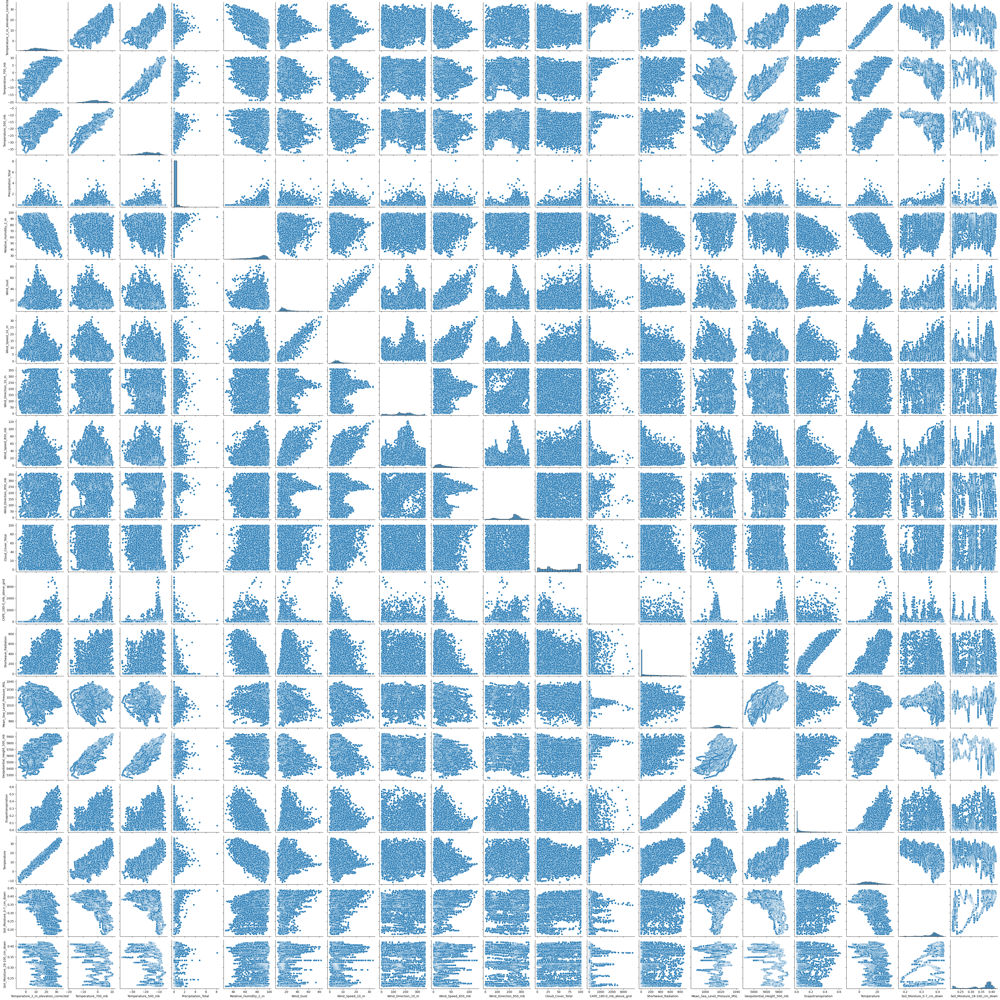

In [5]:
# Visualize the distribution of each column
cleaned_df.hist(figsize=(15, 10))
plt.tight_layout()
plt.show()

# Box plots to check for outliers
plt.figure(figsize=(15, 10))
cleaned_df.boxplot()
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Pair plot to visualize relationships between variables
sns.pairplot(cleaned_df)
plt.show()


In [6]:
# Drop the 'location' column if it exists
if 'location' in cleaned_df.columns:
    cleaned_df = cleaned_df.drop(columns=['location'])

# Define features and target variable
X = cleaned_df.drop(columns=['Temperature_2_m_elevation_corrected'])
y = cleaned_df['Temperature_2_m_elevation_corrected']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Impute missing values
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

In [7]:
from sklearn.model_selection import KFold

# Initialize KFold with 5 splits
kf = KFold(n_splits=5)

# Lists to store evaluation metrics for each fold
mse_scores = []
mae_scores = []
r2_scores = []

# Perform KFold cross-validation
for train_index, test_index in kf.split(X_test_imputed):
    X_val_train, X_val_test = X_test_imputed[train_index], X_test_imputed[test_index]
    y_val_train, y_val_test = y_test.iloc[train_index], y_test.iloc[test_index]
    
    # Train Linear Regression model
    linear_model = LinearRegression()
    linear_model.fit(X_val_train, y_val_train)
    
    # Make predictions
    lr_pred = linear_model.predict(X_val_test)
    
    # Evaluate the model
    mse_scores.append(mean_squared_error(y_val_test, lr_pred))
    mae_scores.append(mean_absolute_error(y_val_test, lr_pred))
    r2_scores.append(r2_score(y_val_test, lr_pred))

print("Linear Regression MSE Scores:", mse_scores)
print("Linear Regression MSE Mean:", np.mean(mse_scores))
print("Linear Regression MAE Scores:", mae_scores)
print("Linear Regression MAE Mean:", np.mean(mae_scores))
print("Linear Regression R^2 Scores:", r2_scores)
print("Linear Regression R^2 Mean:", np.mean(r2_scores))

Linear Regression MSE Scores: [0.87501865818306, 0.8707683079985903, 0.919698339218118, 0.9167831575892258, 0.8999885145516686]
Linear Regression MSE Mean: 0.8964513955081326
Linear Regression MAE Scores: [0.7226210761813321, 0.7377165848515271, 0.734353978175892, 0.7200779758323967, 0.735810103549475]
Linear Regression MAE Mean: 0.7301159437181245
Linear Regression R^2 Scores: [0.9830968425973928, 0.9837549947373574, 0.9845719589622645, 0.9842041951300279, 0.9848456719380506]
Linear Regression R^2 Mean: 0.9840947326730186


In [ ]:
# Hyperparameter tuning for Random Forest using RandomizedSearchCV
param_dist = {
    'n_estimators': sp_randint(100, 300),
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': sp_randint(2, 10),
    'min_samples_leaf': sp_randint(1, 4)
}
rf_model = RandomForestRegressor()
rf_random_search = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, n_iter=50, cv=3, scoring='r2', n_jobs=-1, random_state=42)
rf_random_search.fit(X_train_imputed, y_train)
best_rf_model = rf_random_search.best_estimator_

# Initialize KFold with 5 splits
kf = KFold(n_splits=5)

# Lists to store evaluation metrics for each fold
mse_scores = []
mae_scores = []
r2_scores = []

# Perform KFold cross-validation
for train_index, test_index in kf.split(X_test_imputed):
    X_val_train, X_val_test = X_test_imputed[train_index], X_test_imputed[test_index]
    y_val_train, y_val_test = y_test.iloc[train_index], y_test.iloc[test_index]
    
    # Train the best Random Forest model
    best_rf_model.fit(X_val_train, y_val_train)
    
    # Make predictions
    rf_pred = best_rf_model.predict(X_val_test)
    
    # Evaluate the model
    mse_scores.append(mean_squared_error(y_val_test, rf_pred))
    mae_scores.append(mean_absolute_error(y_val_test, rf_pred))
    r2_scores.append(r2_score(y_val_test, rf_pred))

print("Random Forest MSE Scores:", mse_scores)
print("Random Forest MSE Mean:", np.mean(mse_scores))
print("Random Forest MAE Scores:", mae_scores)
print("Random Forest MAE Mean:", np.mean(mae_scores))
print("Random Forest R^2 Scores:", r2_scores)
print("Random Forest R^2 Mean:", np.mean(r2_scores))

In [20]:
# Create a VotingRegressor with Linear Regression and Random Forest
ensemble_model = VotingRegressor(estimators=[
    ('lr', linear_model),
    ('rf', best_rf_model)
])

# Cross-validation scores for the ensemble model
ensemble_cv_scores = cross_val_score(ensemble_model, X_train_imputed, y_train, cv=5, scoring='r2')

# Fit the ensemble model
ensemble_model.fit(X_train_imputed, y_train)

# Make predictions with the ensemble model
ensemble_pred = ensemble_model.predict(X_test_imputed)

# Evaluate the ensemble model
ensemble_model_mse = mean_squared_error(y_test, ensemble_pred)
ensemble_model_mae = mean_absolute_error(y_test, ensemble_pred)
ensemble_model_r2 = r2_score(y_test, ensemble_pred)

print("Ensemble Model CV R^2 Scores:", ensemble_cv_scores)
# Perform KFold cross-validation on the test data
kf = KFold(n_splits=5)

# Lists to store evaluation metrics for each fold
mse_scores = []
mae_scores = []
r2_scores = []

for train_index, test_index in kf.split(X_test_imputed):
    X_val_train, X_val_test = X_test_imputed[train_index], X_test_imputed[test_index]
    y_val_train, y_val_test = y_test.iloc[train_index], y_test.iloc[test_index]
    
    # Make predictions with the ensemble model
    ensemble_pred = ensemble_model.predict(X_val_test)
    
    # Evaluate the model
    mse_scores.append(mean_squared_error(y_val_test, ensemble_pred))
    mae_scores.append(mean_absolute_error(y_val_test, ensemble_pred))
    r2_scores.append(r2_score(y_val_test, ensemble_pred))

print("Ensemble Model CV R^2 Mean:", np.mean(ensemble_cv_scores))
print("Ensemble Model KFold MSE Scores:", mse_scores)
print("Ensemble Model KFold MSE Mean:", np.mean(mse_scores))
print("Ensemble Model KFold MAE Scores:", mae_scores)
print("Ensemble Model KFold MAE Mean:", np.mean(mae_scores))
print("Ensemble Model KFold R^2 Scores:", r2_scores)
print("Ensemble Model KFold R^2 Mean:", np.mean(r2_scores))
print("Ensemble Model MSE:", ensemble_model_mse)
print("Ensemble Model MAE:", ensemble_model_mae)
print("Ensemble Model R^2 Score:", ensemble_model_r2)

Ensemble Model CV R^2 Scores: [0.98659973 0.98667957 0.98730414 0.98784931 0.98664387]
Ensemble Model CV R^2 Mean: 0.9870153235216149
Ensemble Model KFold MSE Scores: [0.6617730357621363, 0.6991150014697296, 0.6322330155951038, 0.671450479901887, 0.6364226723816693]
Ensemble Model KFold MSE Mean: 0.6601988410221052
Ensemble Model KFold MAE Scores: [0.618097400970824, 0.6500384920407511, 0.6159551692754466, 0.6213357260713357, 0.6205442244848726]
Ensemble Model KFold MAE Mean: 0.625194202568646
Ensemble Model KFold R^2 Scores: [0.9872162111245536, 0.9869573493043496, 0.989394221459283, 0.9884311784388915, 0.9892836877277942]
Ensemble Model KFold R^2 Mean: 0.9882565296109744
Ensemble Model MSE: 0.6601997887612616
Ensemble Model MAE: 0.6251899299608203
Ensemble Model R^2 Score: 0.9883525455049916
